# Repetition and Median Filtering

<p align="center">
<iframe width="560" height="315" src="https://www.youtube.com/embed/FTQbiNvZqaY" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>
</p>

```{dropdown} Video not working?
Here is a <a href="">OneDrive link</a> to the full video.
<a href=""></a>
```

In this section, we will learn about source separation approaches that exploit a common feature of musical signals: repetition. In doing so, we will gain some understanding of the mechanics of source separation and how the an algorithm can assumptions about a signal to separate 

In this section, we will explore three algorithms that attempt to separate a repeating background from a non-repeating foreground. The basic assumption here is 1) that there is repetition in the mixture, and 2) the repetition captures what we want to separate. This assumption holds quite well if we want to separate a singer from a backing band, but might not work if we want to isolate a drum set from the rest of the band because the drum set is usually playing a repeating pattern. We will see that two of these ways to separate out repetition leverages the median operation, which is 

We will also explore a related method (HPSS) that uses similar techniques to 

For more details about these algorithms

## REPET

The first algorithm we will explore here is called the REpeating Patern Extraction Technique or REPET {cite}. REPET works like this:

  1. Find a repeating period, $t_r$ seconds (_e.g._, the number of seconds which a chord progression might start over).
  2. Segment the spectrogram into $N$ segments, each with $t_r$ seconds in length.
  3. "Overlay" those $N$ segments.
  4. Take the median of those $N$ stacked segments and make a mask of the median values.

We'll use REPET to demonstrate how to run a source separation algorithm in `nussl`.

In [3]:
# Do our imports
import nussl
import matplotlib.pyplot as plt

Let's download an audio file that has a lot of repetition in it, and inspect and listen to it:

Matching file found at /Users/ethanmanilow/.nussl/audio/historyrepeating_7olLrex.wav, skipping download.


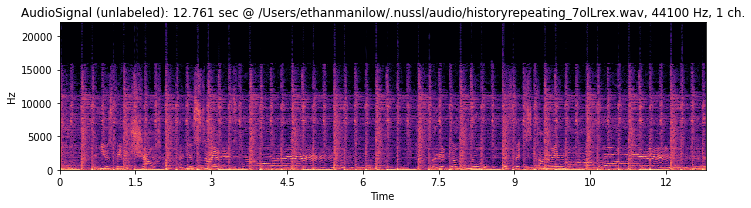

In [4]:
audio_path = nussl.efz_utils.download_audio_file('historyrepeating_7olLrex.wav')
history = nussl.AudioSignal(audio_path)
history.embed_audio()

plt.figure(figsize=(10, 3))
nussl.utils.visualize_spectrogram(history)
plt.title(str(history))
plt.tight_layout()
plt.show()

Now we need to instantiate a `Repet` object in `nussl`. We can do that like so:

In [5]:
repet = nussl.separation.primitive.Repet(history)

Now the `repet` object has our AudioSignal, it's easy to run the algorithm:

In [7]:
repet.run()

Oh, look! The `repet` object returned masks! We can get audio signals back by doing the following:

In [14]:
r_estimates = repet.make_audio_signals()

We can also chain both of those operations if we don't care about the intermediate steps:

In [15]:
r_estimates = repet()

Let's check out the masks that `repet` made:

In [18]:
def visualize_and_embed(sources):
    """A helper function to make some nice graphs"""
    sources = {
        'Background': sources[0],
        'Foreground': sources[1]
    }
    plt.figure(figsize=(10, 7))
    plt.subplot(211)
    nussl.utils.visualize_sources_as_masks(
        sources, db_cutoff=-60, y_axis='mel')
    plt.subplot(212)
    nussl.utils.visualize_sources_as_waveform(
        sources, show_legend=False)
    plt.tight_layout()
    plt.show()

    nussl.play_utils.multitrack(sources, ext='.wav')

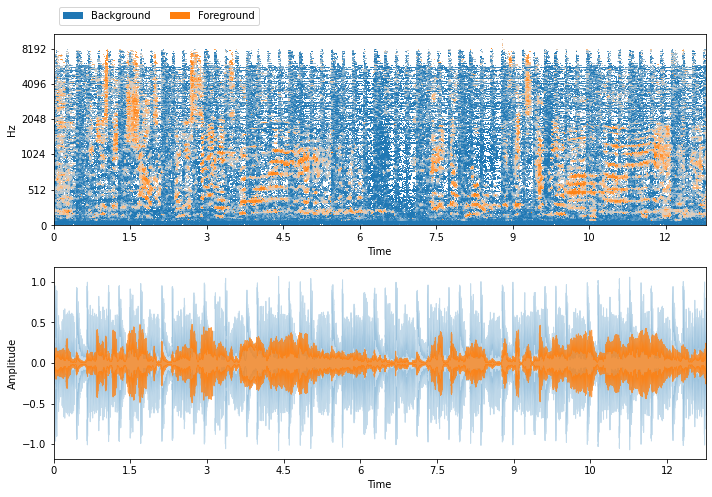


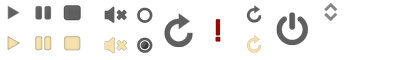
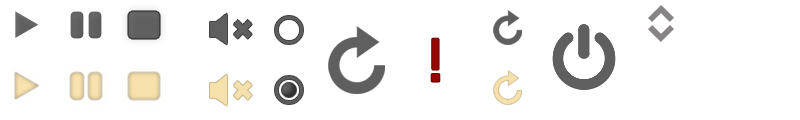
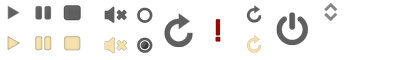

In [19]:
visualize_and_embed(r_estimates)

And there are our foreground and background sources!

The process of running a separation algorithm in `nussl` was only two steps:

  1. Instantiate a separation object with an audio signal. _E.g._, `repet = nussl.separation.primitive.Repet(history)`
  2. Run the object to get the results. _E.g._ `repet()`
  
Now let's look at a few other algorithms that leverage repetition in a musical recording and compare results to REPET.

## REPET-SIM

REPET-SIM is a variant of REPET that doesn't rely on a fixed repeating period. In fact, it doesn't rely on repetition as explicitly as REPET does. REPET-SIM calculates a similarity matrix between each pair of spectral frames in an STFT, selects the $k$ nearest nieghbors for each frame, and makes a mask by median filtering the bins for each of the selected neighbors. 

We can run REPET-SIM the same way we can run REPET:

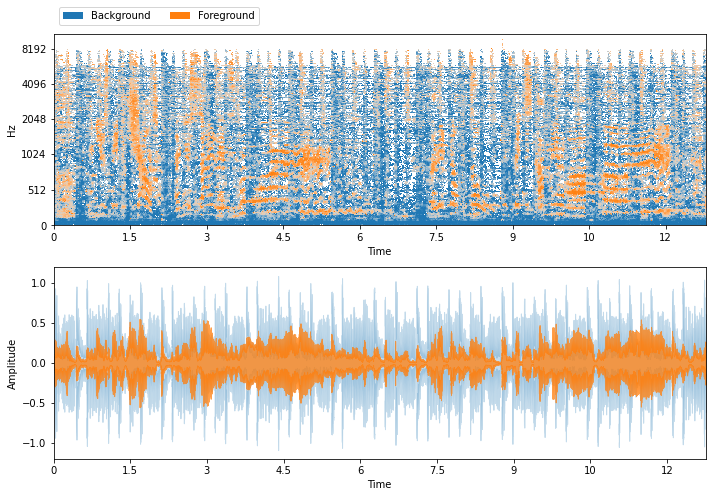


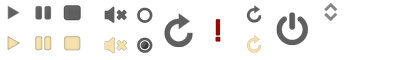
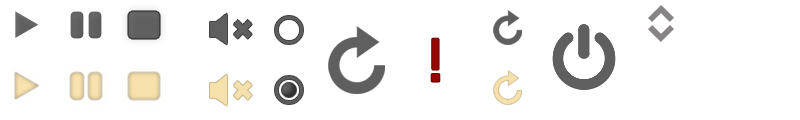
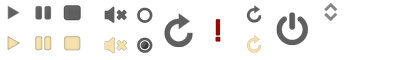

In [20]:
repet_sim = nussl.separation.primitive.RepetSim(history)
rs_estimates = repet_sim()

visualize_and_embed(rs_estimates)

## 2DFT

We can also use a Two-dimensional Fourier Transform (2DFT) of a spectrogram to find repeating and non-repeating patterns. Repeating sections show up as peaks in the 2DFT and non-repeating parts are everything else. We can use a peak picker to separate the repeating from non repeating parts. That's what this algorithm does:


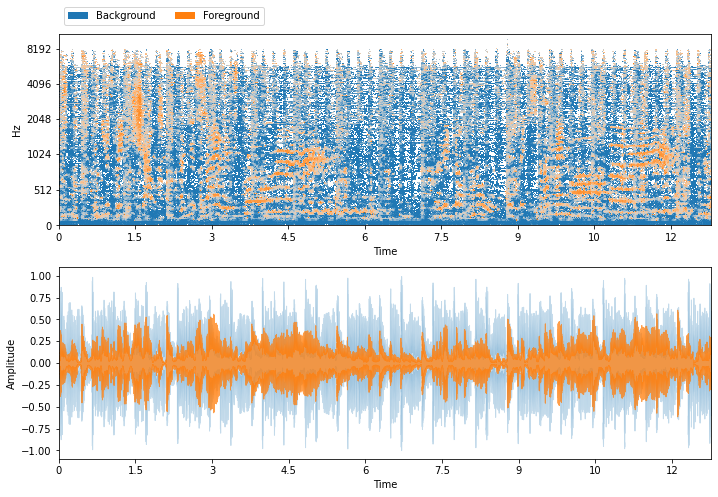


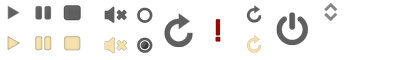
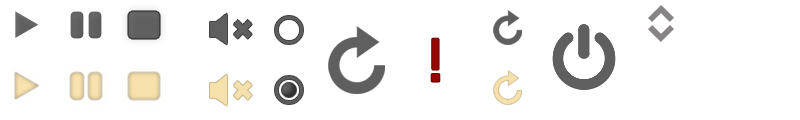
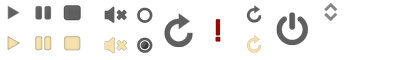

In [22]:
# We can't start a variable name with a number,
# so this object is called FT2D
ft2d = nussl.separation.primitive.FT2D(history)
ft2d_estimates = ft2d()
visualize_and_embed(ft2d_estimates)

## Harmonic-Percussive Source Separation (HPSS)

If you spend enough time visualizing musical signals on a spectrogram, you start to notice that harmonic sounds look similar horizontal stripes on a spectrogram and percussive sounds look similar to vertical stripes. Harmonic-Percussive Source Separation takes advantage of this insight by applying a median filter accross frequency bins (horizontal, or harmonic) and across time bins (vertical, or percussive) to make a mask:

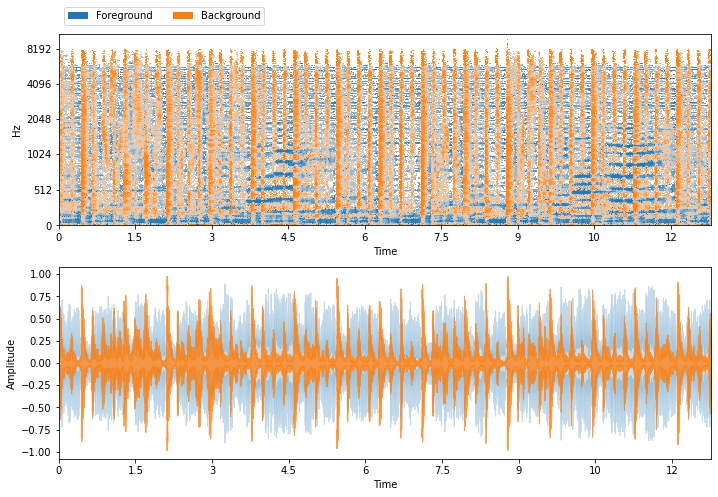


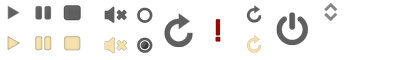
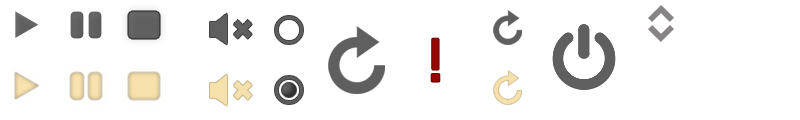
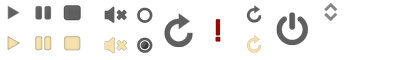

In [23]:
hpss = nussl.separation.primitive.HPSS(history)
hpss_estimates = hpss()[::-1]
# hpss gives harmonic then percussive
# so let's reverse the order of the list
visualize_and_embed(hpss_estimates)

## Next Steps...

There you have it. Four simple algorithms to separate repeating and non-repeating parts and also harmonic and percussive parts.

Next we'll talk about how we can model timbre using Non-negative Matrix Factorization.